# Predicting the Future of COVID-19 with Machine Learning

## Introduction

As of August 2020, the COVID-19 pandemic has claimed over 760,000 lives across the world and over 13 million people have been infected. Understanding the factors and policies that influence the spread of the virus can help governments make informed decisions in order to control infections and deaths until a vaccine is being developed.

The goal of this article is to answer the following questions:

- **What are the factors and policies that have the greatest impact on the number of cases and deaths across the world?**
- **How can we predict the number of COVID-19 cases, deaths, and recoveries in the future?**

## Datasets


In order to answer the questions above, I aggregated data from the following sources:
- Johns Hopkins CCSE Covid-19 Data Repository: https://github.com/CSSEGISandData/COVID-19
- Policy Data From  Oxford Coronavirus Government Response Tracker (OxCGRT): https://ourworldindata.org/policy-responses-covid

I used data aggregated from both sources to train a model that can forecast the number of COVID-19 cases, deaths, and recoveries in any nation months into the future based on a wide range of factors including:
- **GDP**
- **Government response to the coronavirus, including stay-at-home and social distancing restrictions.**
- **The change in mobility of its population since the start of the pandemic.**
- **Demographic data about its population.**
- **Past data regarding the number of cases, deaths, and recoveries.**


## Import Libraries

In [1]:
import numpy as np
import math
import datapane as dp
import pandas as pd
from collections import defaultdict
from functools import reduce
import matplotlib.pyplot as plt
import seaborn as sns
import os
import datetime
import plotly.express as px
import plotly.io as pio
from matplotlib.cm import get_cmap
import plotly.offline as pyo
import plotly.graph_objects as go
pyo.init_notebook_mode(connected=True)
import pycountry
import pyprind
from datetime import timedelta
from pycountry import countries
from geopy.geocoders import Nominatim
from datetime import datetime
from yellowbrick.regressor import ResidualsPlot
from joblib import load, dump
from pandas.tseries.holiday import USFederalHolidayCalendar
import warnings
import matplotlib.style as style
style.use('seaborn-talk')
sns.set_context('talk')
sns.set_style('whitegrid')
warnings.filterwarnings("ignore")
import chart_studio.plotly as py
import chart_studio
import random
username = os.environ['PLOTLY_USERNAME']
api_key = os.environ['PLOTLY_API_KEY']
chart_studio.tools.set_credentials_file(username=username, api_key=api_key)
np.random.seed(0)
random.seed(0)


%matplotlib inline

/Users/amol/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.



## Read Data

In [2]:
covid_19_data = pd.read_csv('./data/covid_19_data.csv')
confirmed_cases = pd.read_csv('./data/time_series_covid19_confirmed_global.csv')
deaths = pd.read_csv('./data/time_series_covid19_deaths_global.csv')
recovered = pd.read_csv('./data/time_series_covid19_recovered_global.csv')
confirmed_cases_us = pd.read_csv('./data/time_series_covid_19_confirmed_US.csv')
owid_covid_data = pd.read_csv('./data/owid-covid-data.csv')


mobility_data = defaultdict()

mobility_data['visitors_grocery_stores'] = pd.read_csv('./data/change-visitors-grocery-stores.csv')
mobility_data['visitors_parks_covid'] = pd.read_csv('./data/change-visitors-parks-covid.csv')
mobility_data['visitors_retail'] = pd.read_csv('./data/change-visitors-retail-recreation.csv')
mobility_data['residential_duration'] = pd.read_csv('./data/changes-residential-duration-covid.csv')
mobility_data['changes_visitors'] = pd.read_csv('./data/changes-visitors-covid.csv')


policy_data = defaultdict()

policy_data['public_events_policies'] = pd.read_csv('./data/public-events-covid.csv')
policy_data['public_gathering_policies'] = pd.read_csv('./data/public-gathering-rules-covid.csv')
policy_data['public_information_campaigns'] = pd.read_csv('./data/public-campaigns-covid.csv')
policy_data['public_transport_policies'] = pd.read_csv('./data/public-transport-covid.csv')
policy_data['school_closures'] = pd.read_csv('./data/school-closures-covid.csv')
policy_data['work_closures'] = pd.read_csv('./data/workplace-closures-covid.csv')
policy_data['stay_at_home_policies'] = pd.read_csv('./data/stay-at-home-covid.csv')
policy_data['contract_tracing'] = pd.read_csv('./data/covid-contact-tracing.csv')
policy_data['debt_relief'] = pd.read_csv('./data/debt-relief-covid.csv')
policy_data['income_support'] = pd.read_csv('./data/income-support-covid.csv')
policy_data['internal_movement'] = pd.read_csv('./data/internal-movement-covid.csv')
policy_data['international_travel'] = pd.read_csv('./data/international-travel-covid.csv')
policy_data['testing_policy'] = pd.read_csv('./data/covid-19-testing-policy.csv')

## Preprocessing Data

### Merging Policy Data and Mobility Data

In [3]:
def get_merged_data(data_dict):
    
    dataframes = list(data_dict.values())
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Entity', 'Code', 'Date'],
                                            how='inner'), dataframes)
    
    return df_merged

def merge_dataframes(dfs, merge_cols):
    
    
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=merge_cols,
                                            how='inner'), dfs)
    
    return df_merged

def filter_by_country(data, country):
    
    return data[data['Country/Region'] == country]

In [4]:
merged_policy_data = get_merged_data(policy_data)
merged_policy_data['Date'] = pd.to_datetime(merged_policy_data['Date'])
merged_policy_data.rename(columns={'Entity': 'Country/Region'}, inplace=True)
merged_policy_data.iloc[100:110]

,Country/Region,Code,Date,Cancel public events (OxBSG),Restrictions on gatherings (OxBSG),Public information campaigns (OxBSG),Close public transport (OxBSG),School closures (OxBSG),Workplace Closures (OxBSG),Stay at home requirements (OxBSG),Contact tracing (OxBSG),Debt/contract relief (OxBSG),Income support (OxBSG),Restrictions on internal movement (OxBSG),International travel controls (OxBSG),Testing policy (OxBSG)
100,Afghanistan,AFG,2020-04-10,2,4,2,2,3,3,2,1,0,0,1,3,1
101,Afghanistan,AFG,2020-04-11,2,4,2,2,3,3,2,1,0,0,1,3,1
102,Afghanistan,AFG,2020-04-12,2,4,2,2,3,3,2,1,0,0,2,3,1
103,Afghanistan,AFG,2020-04-13,2,4,2,2,3,3,2,1,0,0,2,3,1
104,Afghanistan,AFG,2020-04-14,2,4,2,2,3,3,2,1,0,0,2,3,1
105,Afghanistan,AFG,2020-04-15,2,4,2,2,3,3,2,1,0,0,2,3,1
106,Afghanistan,AFG,2020-04-16,2,4,2,2,3,3,2,1,0,0,2,3,1
107,Afghanistan,AFG,2020-04-17,2,4,2,2,3,3,2,1,0,0,2,3,1
108,Afghanistan,AFG,2020-04-18,2,4,2,2,3,3,2,1,0,0,2,3,1
109,Afghanistan,AFG,2020-04-19,2,4,2,2,3,3,2,1,0,0,2,3,1


In [5]:
def fill_forward_data(data, end_date):
    
    countries = list(data['Country/Region'].unique())
    dataframes = []
    
    for country in countries:
        country_data = filter_by_country(data, country)
        last_date = country_data['Date'].max()
        latest_data = data[data['Date'] == last_date] 
        time_diff = (end_date - last_date).days
        
        
        for days in range(1, time_diff + 1):
            new_date = last_date + timedelta(days)
            new_data = latest_data
            new_data['Date'] = new_date
            country_data = country_data.append(new_data)
            #print(country_data['Date'].max())
        
        dataframes.append(country_data)
    
    return pd.concat(dataframes)

In [6]:
merged_mobility_data = get_merged_data(mobility_data)
merged_mobility_data['Date'] = pd.to_datetime(merged_mobility_data['Date'])
merged_mobility_data.rename(columns={'Entity': 'Country/Region'}, inplace=True)
merged_mobility_data = fill_forward_data(merged_mobility_data, end_date = merged_policy_data['Date'].max())
merged_policy_data = pd.merge(merged_policy_data, merged_mobility_data,
                              how='left', 
                              left_on=['Country/Region','Code','Date'], 
                              right_on = ['Country/Region','Code','Date']).fillna(0)

### Transforming Case, Deaths, and Recovered Stats

In [7]:
def group_stats_by_country(df):
    
    cols = list(df.columns[4:])
    country_stats = df.groupby('Country/Region').sum()
    countries = list(country_stats.index)
    
    country_stats['Country/Region'] = countries
        
    #return country_stats.drop(['Lat', 'Long'], axis=1)
    return country_stats

case_stats = group_stats_by_country(confirmed_cases)
deaths_stats = group_stats_by_country(deaths)
recovered_stats = group_stats_by_country(recovered)

def add_date_column(df, metric_name='confirmed_cases'):
    
    data_dict = defaultdict()
    data_dict['Country/Region'] = []
    data_dict['Date'] = []
    data_dict[metric_name] = []
    
    date_cols = list(filter((lambda x: x.count('/') == 2), list(df.columns)))
    n = len(date_cols)
    
    for index, row in df.iterrows():
        country = [row['Country/Region']] * n
        metric_values = list(row[date_cols])
        
        data_dict['Country/Region'] = data_dict['Country/Region'] + country
        data_dict['Date'] = data_dict['Date'] + date_cols
        data_dict[metric_name] = data_dict[metric_name] + metric_values
        
        
    return pd.DataFrame(data_dict)

In [8]:
def monotonic(x):
    dx = np.diff(x)
    return np.all(dx <= 0) or np.all(dx >= 0)


In [9]:
case_stats_by_date = add_date_column(case_stats, metric_name='confirmed_cases')
deaths_stats_by_date = add_date_column(deaths_stats, metric_name='deaths')
recovered_stats_by_date = add_date_column(recovered_stats, metric_name='recovered')

dataframes = [case_stats_by_date, deaths_stats_by_date, recovered_stats_by_date]
all_stats_by_date = merge_dataframes(dataframes, merge_cols=['Country/Region', 'Date'])
all_stats_by_date['Date'] = pd.to_datetime(all_stats_by_date['Date'])
all_stats_by_date.iloc[100:110]

,Country/Region,Date,confirmed_cases,deaths,recovered
100,Afghanistan,2020-05-01,2335,68,310
101,Afghanistan,2020-05-02,2469,72,331
102,Afghanistan,2020-05-03,2704,85,345
103,Afghanistan,2020-05-04,2894,90,397
104,Afghanistan,2020-05-05,3224,95,421
105,Afghanistan,2020-05-06,3392,104,458
106,Afghanistan,2020-05-07,3563,106,468
107,Afghanistan,2020-05-08,3778,109,472
108,Afghanistan,2020-05-09,4033,115,502
109,Afghanistan,2020-05-10,4402,120,558


### Generating Country Codes

In [10]:
code_dict = defaultdict()

def get_country_code(country):
    
    exceptions = {'laos': 'LAO', 
                  'burma': 'MMR', 
                  'congo (brazzaville)': 'COG', 
                  'congo (kinshasa)': 'COD',
                  'korea, south': 'KOR',
                  'diamond princess': 'DMD_PRCS',
                  'ms zaandam': 'MS_ZAND',
                  'taiwan*': 'TWN',
                  'west bank and gaza': 'PSE'}
    
    try:
        try:
            return code_dict[country]
        except:   
            code = countries.search_fuzzy(country)[0].alpha_3
            code_dict[country] = code
            return code
    except:
        if type(country) == float:
            return country
        else:
            code = exceptions[country.lower()]
            code_dict[country] = code
            return code


In [11]:
policy_countries = list(merged_policy_data['Country/Region'].unique())

In [12]:
all_stats_by_date['Code'] = all_stats_by_date['Country/Region'].map(get_country_code)

### Getting Accurate Latitude and Longitude Coordinates

In [13]:
geolocator = Nominatim(user_agent="forecasting_app")
countries = list(all_stats_by_date['Country/Region'].unique())

def create_coordinate_dict(countries):
    
    location_dict = defaultdict()
    for country in countries:
        location = geolocator.geocode(country)
        location_dict[country] = {'latitude': location.latitude, 'longitude': location.longitude}
    
    return location_dict

def get_latitude(country, location_dict):
    
    return location_dict[country]['latitude']

def get_longitude(country, location_dict):
    
    return location_dict[country]['longitude']

location_dict = create_coordinate_dict(countries)

all_stats_by_date['Lat'] = all_stats_by_date['Country/Region'].map(lambda x: get_latitude(x, location_dict))
all_stats_by_date['Long'] = all_stats_by_date['Country/Region'].map(lambda x: get_longitude(x, location_dict))

### Adding Information About Weekends and Weekdays

In [14]:
all_stats_by_date['is_Weekend'] = all_stats_by_date['Date'].apply(lambda x: int(x.weekday() >= 5))

In [15]:
all_stats_by_date

,Country/Region,Date,confirmed_cases,deaths,recovered,Code,Lat,Long,is_Weekend
0,Afghanistan,2020-01-22,0,0,0,AFG,33.768006,66.238514,0
1,Afghanistan,2020-01-23,0,0,0,AFG,33.768006,66.238514,0
2,Afghanistan,2020-01-24,0,0,0,AFG,33.768006,66.238514,0
3,Afghanistan,2020-01-25,0,0,0,AFG,33.768006,66.238514,1
4,Afghanistan,2020-01-26,0,0,0,AFG,33.768006,66.238514,1
...,...,...,...,...,...,...,...,...,...
48687,Zimbabwe,2020-10-02,7858,228,6322,ZWE,-18.455496,29.746841,0
48688,Zimbabwe,2020-10-03,7885,228,6327,ZWE,-18.455496,29.746841,1
48689,Zimbabwe,2020-10-04,7888,228,6359,ZWE,-18.455496,29.746841,1
48690,Zimbabwe,2020-10-05,7898,228,6424,ZWE,-18.455496,29.746841,0


### Merging Policy Data and Cases, Deaths, and Recovery Statistics

In [16]:
factor_data_by_date = merge_dataframes([all_stats_by_date, merged_policy_data], merge_cols=['Code', 'Date'])
factor_data_by_date.drop('Country/Region_y', axis=1, inplace=True)
factor_data_by_date.rename(columns={'Country/Region_x': 'Country/Region'}, inplace=True)

### Adding Additional Fields

In [17]:
owid_covid_data['date'] = pd.to_datetime(owid_covid_data['date'])
owid_covid_data.head(10)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,NaN,0.0,0.0,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
1,AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,NaN,0.0,0.0,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
2,AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,NaN,0.0,0.0,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
3,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,NaN,0.0,0.0,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
4,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,NaN,0.0,0.0,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
5,AFG,Asia,Afghanistan,2020-01-05,0.0,0.0,NaN,0.0,0.0,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
6,AFG,Asia,Afghanistan,2020-01-06,0.0,0.0,0.0,0.0,0.0,0.0,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
7,AFG,Asia,Afghanistan,2020-01-07,0.0,0.0,0.0,0.0,0.0,0.0,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
8,AFG,Asia,Afghanistan,2020-01-08,0.0,0.0,0.0,0.0,0.0,0.0,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
9,AFG,Asia,Afghanistan,2020-01-09,0.0,0.0,0.0,0.0,0.0,0.0,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498


In [18]:
all_data_by_date = pd.merge(factor_data_by_date, owid_covid_data,
         how='left', 
         left_on=['Code','Date'], 
         right_on = ['iso_code','date']).drop_duplicates(subset=['Country/Region', 'Date', 'Code', 'Lat', 'Long'])

### Computing Differences

In [19]:
def compute_diffs(df, split_col='Country/Region', fields=['confirmed_cases', 'deaths', 'recovered']):
    
    data_dict = defaultdict()
    codes = (df[split_col].unique())
    
    for code in codes:
        df_code = df[df[split_col] == code]
        df_code['Date'] = pd.to_datetime(df_code['Date'])
        df_code = df_code.sort_values(by='Date')
        
        for field in fields:
            #print('Country: ', code, ' field: ', field, ' is monotonic: ', monotonic(df_code[field]))
            df_code[field + '_diff'] = np.diff(df_code[field], prepend = 0)
    
        data_dict[code] = df_code
    
    return pd.concat(list(data_dict.values()))

In [20]:
all_data_by_date_diffs = compute_diffs(all_data_by_date)

## Exploratory Data Analysis and Visualizations

### Setting up Visualization Color Cycle and Formatting Datetime Columns

In [21]:
from datetime import datetime
dates = confirmed_cases.columns[4:].map(lambda date: datetime.strptime(date, '%m/%d/%y'))

In [22]:
from matplotlib.colors import hsv_to_rgb
from cycler import cycler

# 1000 distinct colors:
colors = [hsv_to_rgb([(i * 0.618033988749895) % 1.0, 1, 1])
          for i in range(1000)]
plt.rc('axes', prop_cycle=(cycler('color', colors)))

### Visualizing Case Counts on a Map

In [23]:
fig = px.choropleth(case_stats_by_date, 
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "blues",
                    color = 'confirmed_cases',
                    title='COVID-19 Cases')

fig.show()
report = dp.Report(dp.Plot(fig) ) #Create a report
report.publish(name='covid_cases', open=True, visibility='PUBLIC') #Publish the report
#pio.write_html(fig, file = './visualizations/covid_cases_by_date.html', auto_open=True)
#fig.show("svg")
#fig.write_image('./visualizations/confirmed_cases.svg')

Publishing report and associated data - please wait..
Report successfully published at https://datapane.com/AmolMavuduru/reports/covid_cases/


### Visualizing Deaths on a Map

In [24]:
fig = px.choropleth(deaths_stats_by_date,
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "reds",
                    color = 'deaths',
                    title='COVID-19 Deaths')

fig.show()
report = dp.Report(dp.Plot(fig) ) #Create a report
report.publish(name='covid_deaths', open=True, visibility='PUBLIC') #Publish the report
#py.plot(fig, filename = 'covid_deaths_by_date', auto_open=True)
#fig.show("svg")
#fig.write_image('./visualizations/deaths.svg')

Publishing report and associated data - please wait..
Report successfully published at https://datapane.com/AmolMavuduru/reports/covid_deaths/


### Visualizing Recovered Cases on a Map

In [25]:
fig = px.choropleth(recovered_stats_by_date,
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "greens",
                    color = 'recovered',
                    title='COVID-19 Recovered Cases')

fig.show()
report = dp.Report(dp.Plot(fig) ) #Create a report
report.publish(name='covid_recoveries', open=True, visibility='PUBLIC') #Publish the report
#py.plot(fig, filename = 'covid_recoveries_by_date', auto_open=True)
#fig.show("svg")
#fig.write_image('./visualizations/recovered.svg')

Publishing report and associated data - please wait..
Report successfully published at https://datapane.com/AmolMavuduru/reports/covid_recoveries/


### Defining Utility Functions

In [26]:
def plot_columns(data, country, columns):
    
    country_data = data[data['Country/Region'] == country]
    plt.figure(figsize=(15, 10))
    for column in columns:
        plt.plot(country_data['Date'], country_data[column], label=column)
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.legend(loc='best')
    plt.title('Trends for {}'.format(country))
    plt.show()
    
def filter_by_country(data, country):
    
    return data[data['Country/Region'] == country]

In [27]:
def get_policy_counts(data):
    
    policy_counts_dict = defaultdict()
    policy_cols = list(filter(lambda x: 'OxBSG' in x, list(data.columns)))
    
    data_one_hot = pd.get_dummies(data, columns=policy_cols)
    new_policy_cols = list(filter(lambda x: 'OxBSG' in x, list(data_one_hot.columns)))
    
    countries = data['Country/Region'].unique()
    
    for col in new_policy_cols + ['Country/Region']:
        policy_counts_dict[col] = []
        
        
    for country in countries:
        policy_counts_dict['Country/Region'].append(country)
        country_data = filter_by_country(data_one_hot, country=country)
        policy_counts = country_data[new_policy_cols].sum()
        for col in new_policy_cols:
            policy_counts_dict[col].append(policy_counts[col])
            
    
    return pd.DataFrame(policy_counts_dict)

policy_counts_data = get_policy_counts(all_data_by_date_diffs)

## What measures are most effective at slowing the spread of COVID-19?

### Creating Country Profiles

In order to understand the policies and factors that are most effective at slowing the spread of COVID-19, we can look at the differences in COVID-19 statistics among different countries and compare the policies and demographic data for each country. By creating a profile for each country with policy and demographic information along with COVID-19 statistics, we can find out what policies are most effective at controlling COVID-19 and what types of countries were hardest hit by the pandemic. We can then train a tree-based model such as XGBoost to predict COVID-19 statistics based on the policy and demographic data in a given country and use the model to determine the importance of each feature.

In [28]:
def create_country_profiles(data, drop_cols):
    
    policy_cols = list(filter(lambda x: 'OxBSG' in x, list(data.columns)))
    last_date = data['Date'].max()
    latest_data = data[data['Date'] == last_date]
    policy_counts_data = get_policy_counts(data)
    original_policy_cols = list(filter(lambda x: 'OxBSG' in x, list(latest_data.columns)))
    latest_data.drop(policy_cols, axis=1, inplace=True)
    
    country_profiles = pd.merge(latest_data, policy_counts_data, 
         how='inner', 
         on=['Country/Region'])
    
    country_profiles.drop(drop_cols, axis=1, inplace=True)
    
    return country_profiles  

In [29]:
drop_cols = ['total_cases', 'new_cases', 'new_cases_smoothed',
             'new_deaths_smoothed', 'new_deaths_smoothed_per_million',
             'total_deaths', 'new_tests_smoothed_per_thousand',
             'new_tests_smoothed', 'date', 'iso_code', 'new_tests',
             'new_deaths', 'tests_per_case', 'new_cases_smoothed_per_million', 'new_deaths_per_million']

country_profiles = create_country_profiles(all_data_by_date_diffs, drop_cols)

In [30]:
country_profiles = pd.get_dummies(country_profiles, columns=['tests_units'])

### Training XGBoost Model to Gauge Feature Importance

In [31]:
from xgboost import XGBRegressor, plot_importance
xgb = XGBRegressor(n_estimators=50)

### What factors have the greatest overall impact on the total number of confirmed cases?

With the total number of confirmed as the target variable, we can train an XGBoost model and use it identify which factors and policies have the greatest overall impact on the total number of cases in any given country. 

In [32]:
def build_importance_plot(X, y):
    
    xgb = XGBRegressor(n_estimators=100)
    xgb.fit(X, y)
    
    fig, ax = plt.subplots(figsize=(10, 15))
    plot_importance(xgb, max_num_features=30, ax=ax)

In [33]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code', 
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['confirmed_cases']

[14:41:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


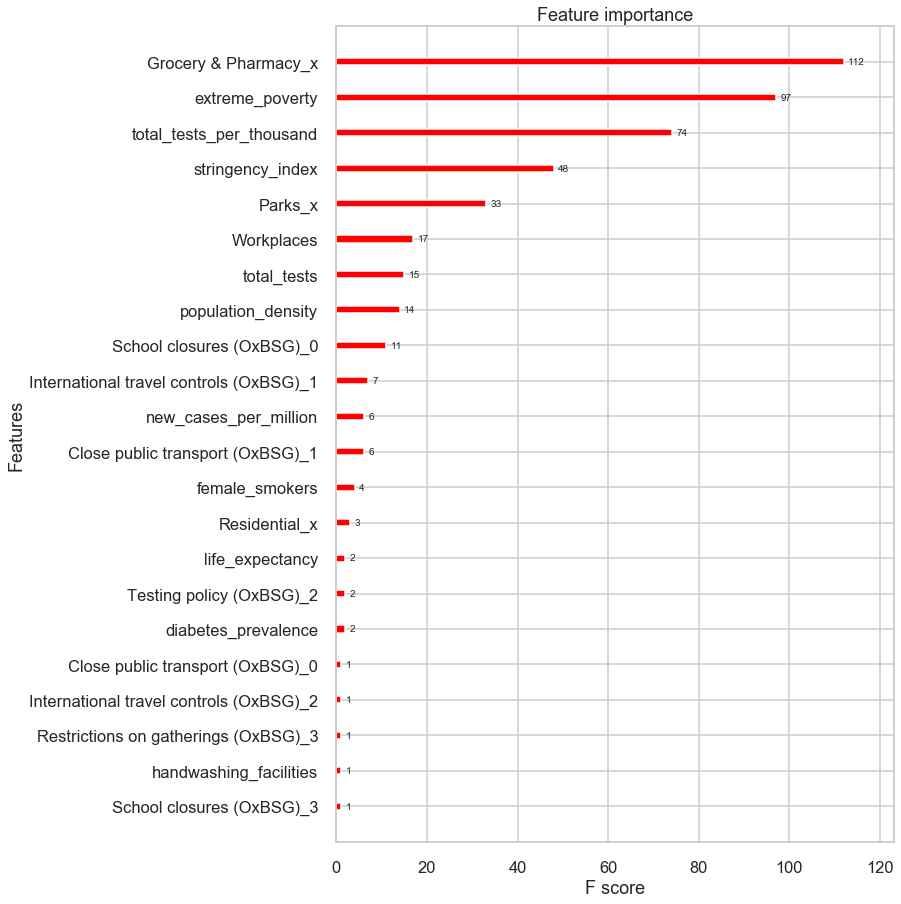

In [34]:
build_importance_plot(X, y)

### What factors have the greatest impact on the total number of deaths?

We can repeat this same process, this time using the total number of deaths as the target variable to find out which factors have the greatest impact on the total number of deaths.

[14:41:26] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


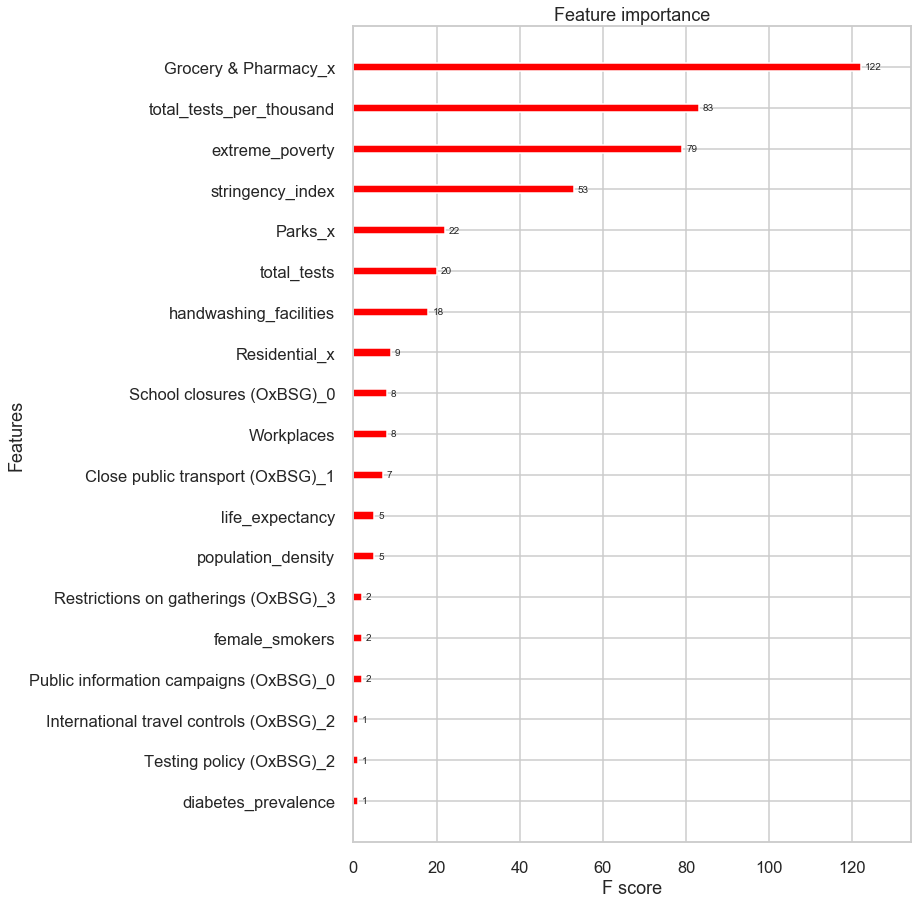

In [35]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code', 
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million', 'new_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['deaths']

build_importance_plot(X, y)

### What factors have the greatest impact on the total number of recovered cases?

We can repeat this same process, this time using the total number of recoveries as the target variable to find out which factors have the greatest impact on the total number of recoveries.

[14:41:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


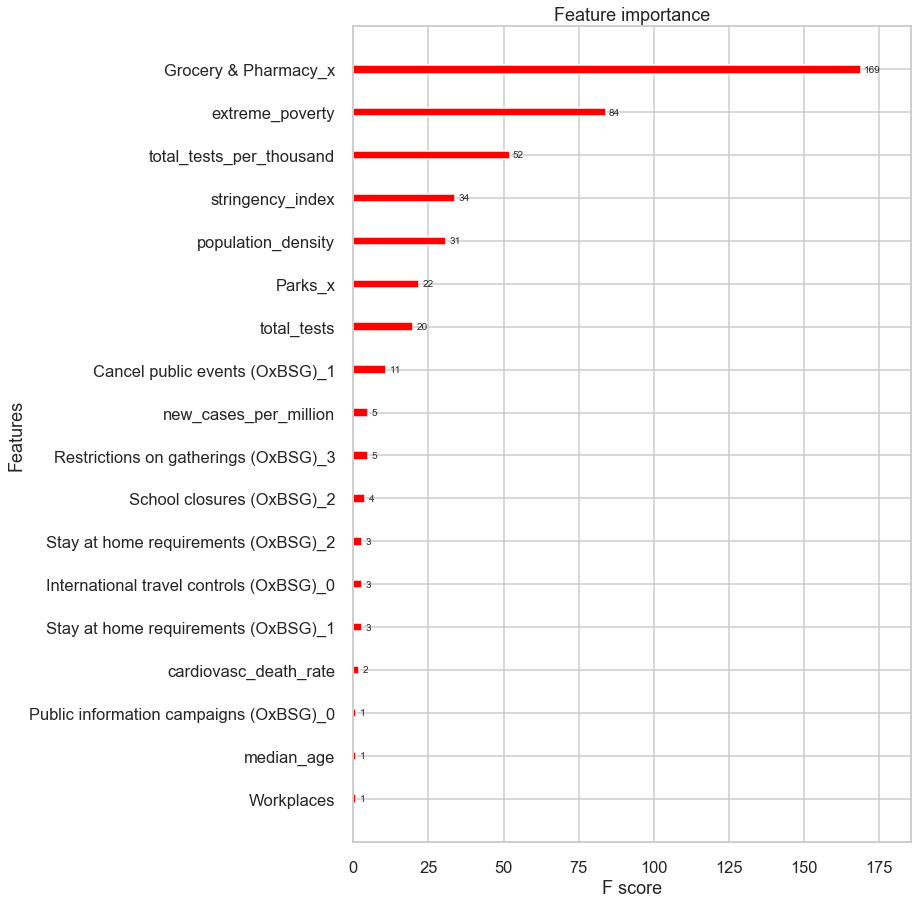

In [36]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['recovered']

build_importance_plot(X, y)

### What factors have the greatest impact on the total number of confirmed cases per million people?

[14:41:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


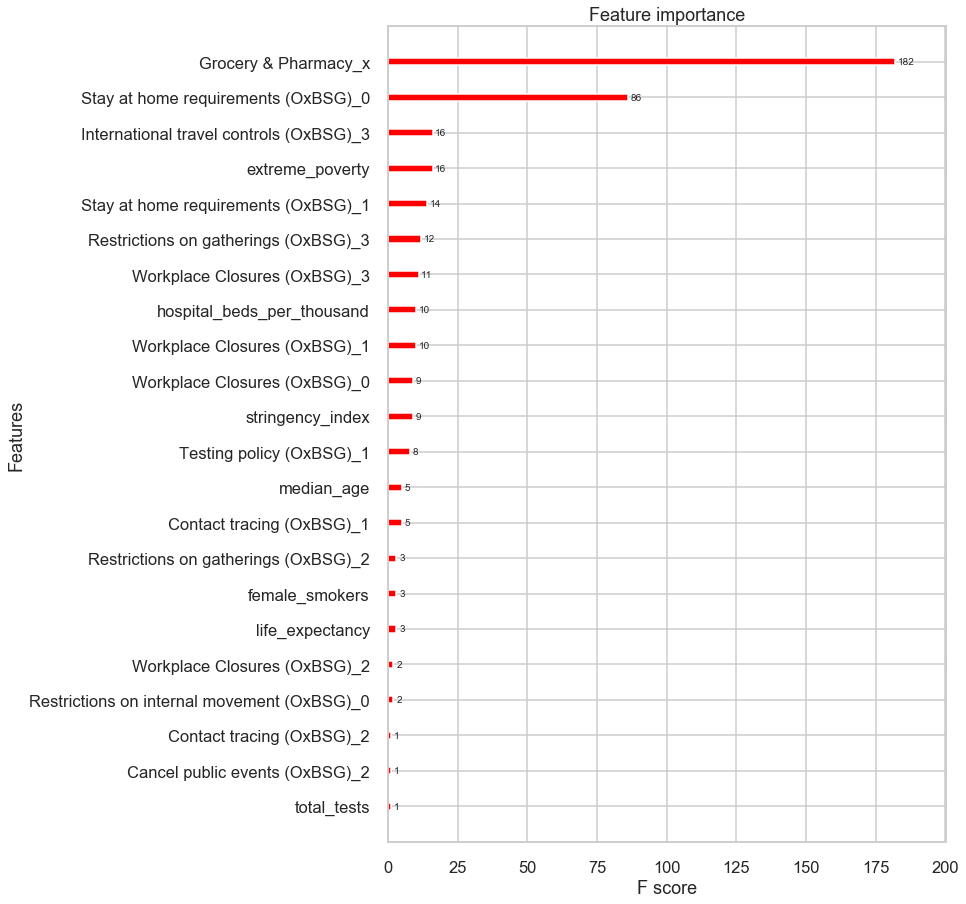

In [37]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million', 'new_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['total_cases_per_million']

build_importance_plot(X, y)

### Total Deaths Per Million as Target

[14:41:28] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


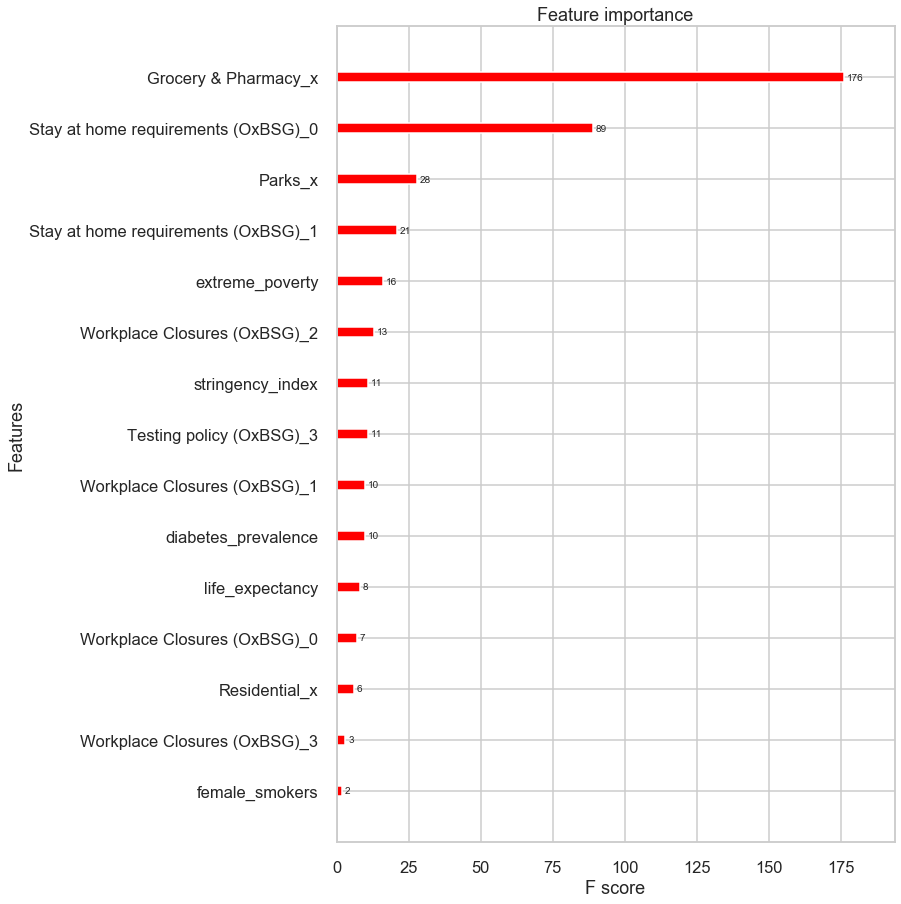

In [38]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million', 'new_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['total_deaths_per_million']

build_importance_plot(X, y)

## Forecasting COVID-19 Cases, Deaths and Recoveries, on a Daily Basis

In [39]:
def create_timeseries_dataset(data, targets):
    
    n = len(data)
    X = data.iloc[0:n-1]
    y = data.iloc[1:n][targets]
    
    return X, y

def compute_cumulative_statistics(data, targets):
    
    for target in targets:
        data[target + '_cum_median'] = data[target].expanding().median()
        data[target + '_cum_mean'] = data[target].expanding().mean()
        data[target + '_cum_var'] = data[target].expanding().var()
        data[target + '_cum_max'] = data[target].cummax()
        
    return data

def create_timeseries_dataset_all_countries(data, targets):
    
    countries = list(data['Country/Region'].unique())
    
    X_data = []
    y_data = []
    
    for country in countries:
        country_data = compute_cumulative_statistics(filter_by_country(data, country), targets)
        X_i, y_i = create_timeseries_dataset(country_data, targets)
        X_data.append(X_i)
        y_data.append(y_i)
    
    X = pd.concat(X_data, axis=0)
    y = np.concatenate(y_data)
    
    
   # X.rename({target: 'current_' + target}, inplace=True)
    
    return X, y

def train_test_split_by_date(X, y, start_date, 
                             cutoff_date, targets=['confirmed_cases_diff', 'deaths_diff', 'recovered_diff'],
                            drop_negatives=True):
    
    targets = [target + '_next' for target in targets]
    data = X
    target_cond = True
    for index, target in enumerate(targets):
        data[target] = y[:, index]
        target_cond = target_cond & (data[target] >= 0)
        
    if drop_negatives:
        data = data[target_cond].reset_index().drop('index', axis=1)
        
    train = data[(data['Date'] >= start_date) & (data['Date'] <= cutoff_date)]
    test = data[data['Date'] > cutoff_date]
    
    X_train, y_train = train.drop(targets +  ['Date'], axis=1), train[targets]
    X_test, y_test = test.drop(targets + ['Date'], axis=1), test[targets]
    
    return X_train, X_test, y_train, y_test

## Forecasting Cases

### Preparing the Data

In [40]:
drop_cols = ['Code', 'new_cases','new_deaths', 'total_cases_per_million',
                          'new_cases_per_million', 'total_deaths_per_million', 'total_deaths',
                          'new_deaths_per_million', 'total_cases', 'new_cases', 'new_tests_smoothed',
                          'new_tests', 'total_tests', 'total_tests_per_thousand', 'new_tests_smoothed_per_thousand',
                          'new_tests_per_thousand', 'tests_per_case', 'positive_rate',
                          'continent', 'location', 'iso_code', 'date', 'tests_units']

data_for_timeseries = all_data_by_date_diffs.drop(drop_cols, axis=1)


X, y = create_timeseries_dataset_all_countries(data_for_timeseries, 
                                               targets=['confirmed_cases_diff', 'deaths_diff', 'recovered_diff'])
X.drop('Country/Region', axis=1, inplace=True)
policy_cols = list(filter(lambda x: 'OxBSG' in x, list(X.columns)))


In [41]:
from sklearn.model_selection import train_test_split, cross_validate, KFold
from sklearn.metrics import r2_score, mean_squared_error
train_data = defaultdict()

start_date = datetime(2020, 1, 1)
cutoff_date = datetime(2020, 8, 24)
X_train, X_test, y_train, y_test = train_test_split_by_date(X, y, start_date, cutoff_date)
train_data['X_train'], train_data['X_val'], train_data['y_train'], train_data['y_val'] = train_test_split(X_train,
                                                                                                          y_train,
                                                                                                          test_size=0.2)

In [42]:
from sklearn.metrics import r2_score, mean_absolute_error

def mean_absolute_percentage_error(y_pred, y_true):
    
    n = len(y_pred)
    percentage_errors = np.abs(y_pred - y_true) / np.abs(y_true)
    mape = np.average(percentage_errors, dtype=np.float64)
    return mape

def evaluate_model(model, X_test, y_test):
    
    pred = model.predict(X_test)
    r2_value = r2_score(y_test, pred)
    n = len(y_test)
    p = X_test.shape[1]
    adj_r2 = 1 - ((1 - r2_value) * (n - 1)/(n - p - 1))
    print('R2 = {}'.format(r2_value))
    print('Adjusted R2 = {}'.format(adj_r2))
    print('MAE = {}'.format(mean_absolute_error(y_test, pred)))
    print('Average Predicted Value = {}'.format(np.mean(pred)))
    print('Average Actual Value = {}'.format(np.mean(y_test)))
    
    fig = go.Figure(go.Indicator(
    value = r2_value,
    mode = "gauge+number",
    title = {'text': "R^2 Score"},
    gauge = {'bar': {'color': "lightgreen"},
        'axis': {'range': [None, 1]},
             'steps' : [
                 {'range': [0, 0.5], 'color': "lightgray"},
                 {'range': [0.5, 1], 'color': "gray"}],
          }))
    
    fig.show()
    
    fig = go.Figure(go.Indicator(
    value = adj_r2,
    mode = "gauge+number",
    title = {'text': "Adjusted R^2 Score"},
    gauge = {'bar': {'color': "lightgreen"},
        'axis': {'range': [None, 1]},
             'steps' : [
                 {'range': [0, 0.5], 'color': "lightgray"},
                 {'range': [0.5, 1], 'color': "gray"}],
          }))
    
    fig.show()
    
    return pred
    

def evaluate_model_multi_target(model, X_test, y_test):
    
    pred = model.predict(X_test)
    print('Overall R2 = {}'.format(r2_score(y_test, pred)))
    print('MAE = {}'.format(mean_absolute_error(y_test, pred)))
    print('Average Predicted Confirmed Cases = {}'.format(np.mean(pred[:, 0])))
    print('Average Actual Confirmed Cases = {}'.format(np.mean(y_test.values[:, 0])))
    print('R2 for Confirmed Cases = {}'.format(r2_score(pred[:, 0], y_test.values[:, 0])))
    print('Average Predicted Deaths = {}'.format(np.mean(pred[:, 1])))
    print('Average Actual Deaths = {}'.format(np.mean(y_test.values[:, 1])))
    print('R2 for Deaths = {}'.format(r2_score(pred[:, 1], y_test.values[:, 1])))
    print('Average Predicted Recovered = {}'.format(np.mean(pred[:, 2])))
    print('Average Actual Recovered  = {}'.format(np.mean(y_test.values[:, 2])))
    print('R2 for Recovered = {}'.format(r2_score(pred[:, 2], y_test.values[:, 2])))
    #print('MAPE w/o zeros = {} %'.format(100*mean_absolute_percentage_error(pred, y_test)))
    return pred

In [43]:
def plot_residuals(pred, y_test, label):
    
    
    residuals = pred - y_test
    residual_df = pd.DataFrame({'residuals': residuals, label: y_test})
    sns.jointplot(x=label, y='residuals', data=residual_df, height=10, color='b')

def plot_residuals_multi_target(pred, y_test, index):
    
    residuals = pred[:, index] - y_test.values[:, index]
    residual_df = pd.DataFrame({'residuals': residuals, 'predicted_values': pred[:, index]})
    sns.jointplot(x='predicted_values', y='residuals', data=residual_df, height=10, color='b')

### Writing a Custom Data Cleaning Transformer

In [44]:
from sklearn.preprocessing import FunctionTransformer, StandardScaler
from sklearn.impute import SimpleImputer

def clean_data(X):
    
    policy_cols = list(filter(lambda x: 'OxBSG' in x, list(X.columns)))
    X_one_hot = pd.get_dummies(X, columns=policy_cols)
    imputer = SimpleImputer(strategy='median')
    X_imputed = imputer.fit_transform(X_one_hot)
    
    return X_imputed

data_cleaner = FunctionTransformer(clean_data)

In [45]:
from sklearn.preprocessing import OneHotEncoder    
from sklearn.base import BaseEstimator, TransformerMixin


class CustomOneHotEncoder(BaseEstimator, TransformerMixin):
    
    def __init__(self, encode_cols):
        
        self.encode_cols = encode_cols
        self.col_mapping_dict = defaultdict()
        self.one_hot_cols = defaultdict()
        

    def fit(self, X, y=None):
        
        for col in self.encode_cols:
            unique_values = list(X[col].unique())
            self.col_mapping_dict[col] = unique_values
            self.one_hot_cols[col] = []
            for value in unique_values:
                self.one_hot_cols[col] = self.one_hot_cols[col] + [col + '_' + str(value)]
        
        return self
        
    
    def _one_hot_encode(self, target, value):
        
        return int(target == value);
    
    def transform(self, X):
        
        X_copy = X
        for col in self.encode_cols:
            #print('Working on ', col)
            targets = self.col_mapping_dict[col]
            for target in targets:
                one_hot_col = col + '_' + str(target)
                X_copy[one_hot_col] = X_copy[col].map(lambda x: self._one_hot_encode(target, x))
        
        return X_copy.drop(self.encode_cols, axis=1)
            
        

def make_categorical(data, cat_cols):
    
    for col in cat_cols:
        data[col] = data[col].astype('category')
    
    return data

## Using Deep Learning

### Predicting Cases

In [46]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LassoLarsCV
from sklearn.neural_network import MLPRegressor
from sklearn.base import clone

mlp_pipeline_cases = Pipeline([('encoder', CustomOneHotEncoder(encode_cols=policy_cols)),
                                      ('imputer', SimpleImputer(strategy='median')),
                                      ('scaler', StandardScaler()),
                                      ('mlp', MLPRegressor(hidden_layer_sizes=[90, 90],
                                                           verbose=True))], verbose=True)

mlp_pipeline_cases.fit(X_train, y_train['confirmed_cases_diff_next'])

[Pipeline] ........... (step 1 of 4) Processing encoder, total=   1.5s
[Pipeline] ........... (step 2 of 4) Processing imputer, total=   0.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
Iteration 1, loss = 7143502.48989885
Iteration 2, loss = 2255168.84171143
Iteration 3, loss = 1103606.53917825
Iteration 4, loss = 964470.22456967
Iteration 5, loss = 862010.40367162
Iteration 6, loss = 797422.37948505
Iteration 7, loss = 726090.75505259
Iteration 8, loss = 677138.02059634
Iteration 9, loss = 637181.19054499
Iteration 10, loss = 597617.64023210
Iteration 11, loss = 568381.21103913
Iteration 12, loss = 537359.41552504
Iteration 13, loss = 511350.87308807
Iteration 14, loss = 488035.68957479
Iteration 15, loss = 467972.97024440
Iteration 16, loss = 452463.49468119
Iteration 17, loss = 429922.51033540
Iteration 18, loss = 420314.22695785
Iteration 19, loss = 408935.59283436
Iteration 20, loss = 391304.84384128
Iteration 21, loss = 380502.74708077
Iteration 22, lo

Pipeline(memory=None,
         steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'School closures (OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                    

In [47]:
pred = evaluate_model(mlp_pipeline_cases, X_test, y_test['confirmed_cases_diff_next'])

R2 = 0.9608861244173011
Adjusted R2 = 0.9601552085604528
MAE = 411.97406686468344
Average Predicted Value = 1517.8237263955725
Average Actual Value = 1589.0655981493721


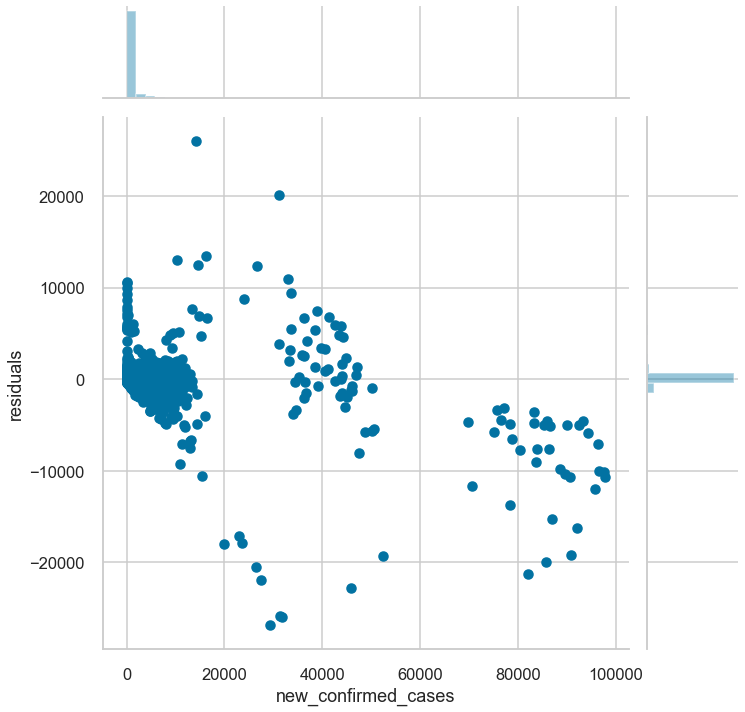

In [48]:
plot_residuals(pred, y_test['confirmed_cases_diff_next'], label='new_confirmed_cases')

In [49]:
X, y = create_timeseries_dataset_all_countries(data_for_timeseries, 
                                               targets=['confirmed_cases_diff', 'deaths_diff', 'recovered_diff'])
X.drop(['Country/Region', 'Date'], axis=1, inplace=True)
mlp_pipeline_cases = clone(mlp_pipeline_cases)
mlp_pipeline_cases.fit(X, y[:, 0])

[Pipeline] ........... (step 1 of 4) Processing encoder, total=   1.8s
[Pipeline] ........... (step 2 of 4) Processing imputer, total=   0.5s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
Iteration 1, loss = 9585590.01468239
Iteration 2, loss = 2643024.92153227
Iteration 3, loss = 1561746.20906388
Iteration 4, loss = 1286413.63754864
Iteration 5, loss = 1109104.52762193
Iteration 6, loss = 982097.77638535
Iteration 7, loss = 894776.94537480
Iteration 8, loss = 826509.47971249
Iteration 9, loss = 778383.13178152
Iteration 10, loss = 734009.93252525
Iteration 11, loss = 692204.44767904
Iteration 12, loss = 659384.26828934
Iteration 13, loss = 633029.22951356
Iteration 14, loss = 611856.32622064
Iteration 15, loss = 587271.74394674
Iteration 16, loss = 569681.80291221
Iteration 17, loss = 553602.82350663
Iteration 18, loss = 535674.56560643
Iteration 19, loss = 523833.76554088
Iteration 20, loss = 511963.75593981
Iteration 21, loss = 501044.94098750
Iteration 22, 

Pipeline(memory=None,
         steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'School closures (OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                    

In [50]:
dump(mlp_pipeline_cases, './models/mlp_pipeline_cases.joblib')

['./models/mlp_pipeline_cases.joblib']

### Predicting Deaths

In [51]:
mlp_pipeline_deaths = Pipeline([('encoder', CustomOneHotEncoder(encode_cols=policy_cols)),
                                      ('imputer', SimpleImputer(strategy='median')),
                                      ('scaler', StandardScaler()),
                                      ('mlp', MLPRegressor(hidden_layer_sizes=[90, 90], 
                                                           early_stopping=True,
                                                           verbose=True))], verbose=True)

mlp_pipeline_deaths.fit(X_train, y_train['deaths_diff_next'])

[Pipeline] ........... (step 1 of 4) Processing encoder, total=   1.5s
[Pipeline] ........... (step 2 of 4) Processing imputer, total=   0.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
Iteration 1, loss = 4991.31529744
Validation score: 0.733634
Iteration 2, loss = 1855.98973058
Validation score: 0.876410
Iteration 3, loss = 1359.72304471
Validation score: 0.903998
Iteration 4, loss = 1250.27364586
Validation score: 0.910507
Iteration 5, loss = 1197.41243903
Validation score: 0.907755
Iteration 6, loss = 1179.33590897
Validation score: 0.910351
Iteration 7, loss = 1146.85757833
Validation score: 0.919882
Iteration 8, loss = 1122.72687251
Validation score: 0.929220
Iteration 9, loss = 1098.35584144
Validation score: 0.930708
Iteration 10, loss = 1081.91878746
Validation score: 0.932688
Iteration 11, loss = 1058.22589420
Validation score: 0.931382
Iteration 12, loss = 1067.42203083
Validation score: 0.936117
Iteration 13, loss = 1039.32574981
Validation score:

Pipeline(memory=None,
         steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'School closures (OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                    

In [52]:
pred = evaluate_model(mlp_pipeline_deaths, X_test, y_test['deaths_diff_next'])

R2 = 0.9020569407596588
Adjusted R2 = 0.9002266916728443
MAE = 11.150053344234564
Average Predicted Value = 29.676680332852136
Average Actual Value = 29.890779907468605


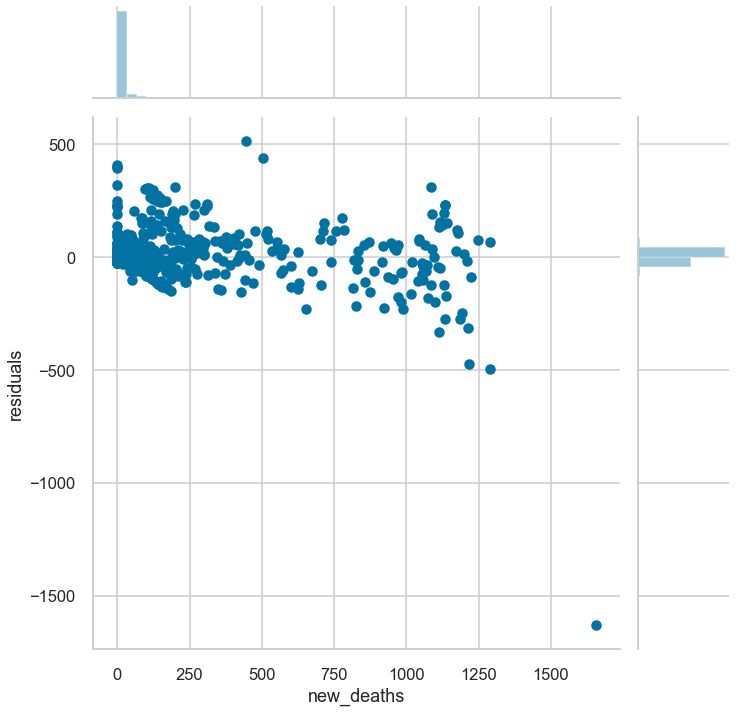

In [53]:
plot_residuals(pred, y_test['deaths_diff_next'], label='new_deaths')

In [54]:
X, y = create_timeseries_dataset_all_countries(data_for_timeseries, 
                                               targets=['confirmed_cases_diff', 'deaths_diff', 'recovered_diff'])
X.drop(['Country/Region', 'Date'], axis=1, inplace=True)
mlp_pipeline_deaths = clone(mlp_pipeline_deaths)
mlp_pipeline_deaths.fit(X, y[:, 1])

[Pipeline] ........... (step 1 of 4) Processing encoder, total=   1.7s
[Pipeline] ........... (step 2 of 4) Processing imputer, total=   0.4s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
Iteration 1, loss = 4776.05746746
Validation score: 0.772592
Iteration 2, loss = 1947.26162268
Validation score: 0.867564
Iteration 3, loss = 1612.94856791
Validation score: 0.888854
Iteration 4, loss = 1492.15814452
Validation score: 0.897133
Iteration 5, loss = 1453.89248354
Validation score: 0.899212
Iteration 6, loss = 1412.92304049
Validation score: 0.906128
Iteration 7, loss = 1376.92762031
Validation score: 0.908143
Iteration 8, loss = 1356.99584636
Validation score: 0.903811
Iteration 9, loss = 1330.69865381
Validation score: 0.909592
Iteration 10, loss = 1317.52445913
Validation score: 0.913059
Iteration 11, loss = 1286.24780589
Validation score: 0.914965
Iteration 12, loss = 1264.53790733
Validation score: 0.918008
Iteration 13, loss = 1248.65588683
Validation score:

Pipeline(memory=None,
         steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'School closures (OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                    

In [55]:
dump(mlp_pipeline_deaths, './models/mlp_pipeline_deaths.joblib')

['./models/mlp_pipeline_deaths.joblib']

### Predicting Recovered Cases

In [56]:
mlp_pipeline_recovered = Pipeline([('encoder', CustomOneHotEncoder(encode_cols=policy_cols)),
                                      ('imputer', SimpleImputer(strategy='median')),
                                      ('scaler', StandardScaler()),
                                      ('mlp', MLPRegressor(hidden_layer_sizes=[90, 90], 
                                                           early_stopping=True,
                                                           verbose=True))], verbose=True)

mlp_pipeline_recovered.fit(X_train, y_train['recovered_diff_next'])

[Pipeline] ........... (step 1 of 4) Processing encoder, total=   1.5s
[Pipeline] ........... (step 2 of 4) Processing imputer, total=   0.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
Iteration 1, loss = 4023075.98872815
Validation score: 0.276249
Iteration 2, loss = 2175151.24172686
Validation score: 0.570243
Iteration 3, loss = 1603784.25916230
Validation score: 0.623596
Iteration 4, loss = 1445843.97734190
Validation score: 0.652242
Iteration 5, loss = 1338944.23232317
Validation score: 0.671947
Iteration 6, loss = 1255883.46419146
Validation score: 0.687913
Iteration 7, loss = 1201354.97642868
Validation score: 0.696925
Iteration 8, loss = 1170324.55676798
Validation score: 0.705571
Iteration 9, loss = 1141845.45833309
Validation score: 0.711627
Iteration 10, loss = 1119682.58182315
Validation score: 0.715567
Iteration 11, loss = 1108618.11241310
Validation score: 0.717868
Iteration 12, loss = 1098272.19659335
Validation score: 0.720194
Iteration 13, lo

Pipeline(memory=None,
         steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'School closures (OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                    

In [57]:
pred = evaluate_model(mlp_pipeline_recovered, X_test, y_test['recovered_diff_next'])

R2 = 0.9303423264570218
Adjusted R2 = 0.9290406426584914
MAE = 513.2648834553487
Average Predicted Value = 1410.4562687418293
Average Actual Value = 1266.5021480502314


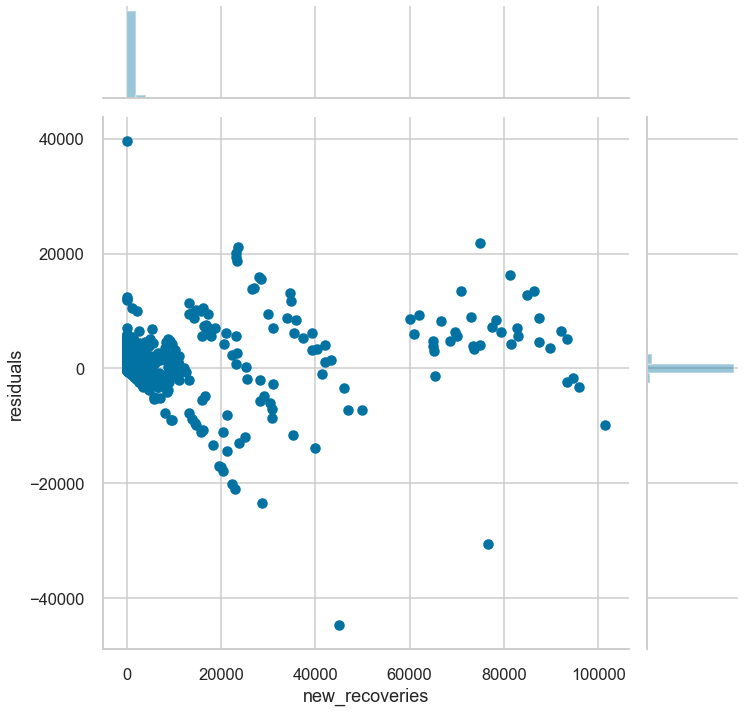

In [58]:
plot_residuals(pred, y_test['recovered_diff_next'], label='new_recoveries')

In [59]:
X, y = create_timeseries_dataset_all_countries(data_for_timeseries, 
                                               targets=['confirmed_cases_diff', 'deaths_diff', 'recovered_diff'])
X.drop(['Country/Region', 'Date'], axis=1, inplace=True)
mlp_pipeline_recovered = clone(mlp_pipeline_recovered)
mlp_pipeline_recovered.fit(X, y[:, 2])

[Pipeline] ........... (step 1 of 4) Processing encoder, total=   1.8s
[Pipeline] ........... (step 2 of 4) Processing imputer, total=   0.4s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
Iteration 1, loss = 6891042.32669155
Validation score: 0.382589
Iteration 2, loss = 3205901.81811997
Validation score: 0.711659
Iteration 3, loss = 2116778.54732489
Validation score: 0.778809
Iteration 4, loss = 1777331.09961926
Validation score: 0.815945
Iteration 5, loss = 1578085.67822561
Validation score: 0.839489
Iteration 6, loss = 1455633.92947936
Validation score: 0.853046
Iteration 7, loss = 1383800.70918945
Validation score: 0.859415
Iteration 8, loss = 1344888.08717294
Validation score: 0.864107
Iteration 9, loss = 1322703.44607718
Validation score: 0.867030
Iteration 10, loss = 1303564.14678665
Validation score: 0.868742
Iteration 11, loss = 1289505.47299386
Validation score: 0.869175
Iteration 12, loss = 1278232.75117826
Validation score: 0.868719
Iteration 13, lo

Pipeline(memory=None,
         steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'School closures (OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                    

In [60]:
dump(mlp_pipeline_recovered, './models/mlp_pipeline_recovered.joblib')

['./models/mlp_pipeline_recovered.joblib']

## Generating and Visualizing Daily Forecasts for COVID-19 in Different Countries

### Loading Models and Defining Utility Functions

In [61]:
cases_model = load('./models/mlp_pipeline_cases.joblib')
deaths_model = load('./models/mlp_pipeline_deaths.joblib')
recovered_model = load('./models/mlp_pipeline_recovered.joblib')

In [62]:
drop_cols = ['Code', 'new_cases','new_deaths', 'total_cases_per_million',
                          'new_cases_per_million', 'total_deaths_per_million', 'total_deaths',
                          'new_deaths_per_million', 'total_cases', 'new_cases', 'new_tests_smoothed',
                          'new_tests', 'total_tests', 'total_tests_per_thousand', 'new_tests_smoothed_per_thousand',
                          'new_tests_per_thousand', 'tests_per_case', 'positive_rate', 'date',
                          'continent', 'location', 'iso_code', 'Date', 'tests_units', 'Country/Region']

stringency_index_cols = ['Cancel public events (OxBSG)', 'Restrictions on gatherings (OxBSG)',
                         'Public information campaigns (OxBSG)', 'Workplace Closures (OxBSG)',
                         'Stay at home requirements (OxBSG)', 'Restrictions on internal movement (OxBSG)',
                         'International travel controls (OxBSG)', 'Testing policy (OxBSG)',
                         'School closures (OxBSG)']

def get_mobility_cols(data):
    
    columns = list(data.columns)
    exceptions = ['Workplaces', 'Transit Stations']
    return list(filter((lambda x: x[-2:] == '_x' or x[-2:] == '_y' or x in exceptions), columns))

mobility_cols = get_mobility_cols(all_data_by_date_diffs)

def rate_percent_increase(percent, rate):
    
    percent_value = 100 + percent
    new_value = percent_value * (1 + rate)
    return new_value - 100


def exponential_mobility_increase(data, mobility_cols, rate=0.1):
    
    if len(data) > 1:
        data = data.reset_index().drop('index', axis=1)
        last_index = data.index[-1]

        for col in mobility_cols:
            data.at[last_index, col] = rate_percent_increase(data.at[last_index, col], rate)
    else:
        for col in mobility_cols:
            data[col] = data[col].map(lambda x: rate_percent_increase(x, rate))
    
    return data


def linear_mobility_increase(data, mobility_cols, delta=0.5):
    
    if len(data) > 1:
        data = data.reset_index().drop('index', axis=1)
        last_index = data.index[-1]

        for col in mobility_cols:
            data.at[last_index, col] = data.at[last_index, col] + delta
    else:
        for col in mobility_cols:
            data[col] = data[col].map(lambda x: x + delta)
    
    return data

def set_policy_cols(data, policy_dict):
    
    if policy_dict is None:
        
        return data
    
    else:
        
        for col, value in policy_dict.items():
            data[col] = data[col].map(lambda x: value)
    
        return data
    
def days_to_predict(data, country, future_date):
    
    country_data = filter_by_country(data, country=country)
    latest_date = country_data['Date'].max()
    
    time_diff = future_date - latest_date
    
    return time_diff.days
    

def create_max_value_dict(data, policy_cols):
    
    data_dict = defaultdict()
    
    for col in policy_cols:
        data_dict[col] = data[col].max()
    
    return data_dict

max_value_dict = create_max_value_dict(all_data_by_date_diffs, policy_cols)

def normalize(policy_col, value, max_value_dict):
    
    return 100.0 * (value / max_value_dict[policy_col])

def calculate_stringency_index(data, policy_cols):
    
    normalized_scores = []
    for col in policy_cols:
        normalized_scores.append(normalize(col, data[col].values[-1], max_value_dict))
    
    return np.mean(np.array(normalized_scores))

def get_latest_data(data, country):
    
    country_data = filter_by_country(data, country=country)
    latest_date = country_data['Date'].max()
    latest_data = country_data[country_data['Date'] == latest_date]
    
    return latest_data
            

def predict_future(data, country, future_date, drop_cols, policy_dict, mobility_dict):
    
    country_data = filter_by_country(data, country=country)
    forecast_results = pd.DataFrame()
    
    n_days = days_to_predict(data, country, future_date)
    
    for i in range(n_days):
        country_data_stats = compute_cumulative_statistics(country_data, 
                                                 targets=['confirmed_cases_diff',
                                                          'deaths_diff',
                                                          'recovered_diff'])
        if i == 0:
            latest_date = country_data_stats['Date'].max()
            latest_data = country_data_stats[country_data['Date'] == latest_date]
            new_date = latest_date + timedelta(days=1)
        else:
            latest_date = forecast_results['Date'].max()
            latest_data = country_data_stats[country_data_stats['Date'] == latest_date]
            new_date = latest_date + timedelta(days=1)  
        
        latest_data = set_policy_cols(latest_data, policy_dict)
        cases_diff = cases_model.predict(latest_data.drop(drop_cols, axis=1))
        deaths_diff = deaths_model.predict(latest_data.drop(drop_cols, axis=1))
        recovered_diff = recovered_model.predict(latest_data.drop(drop_cols, axis=1))
        cases_pred = cases_diff + latest_data['confirmed_cases']
        deaths_pred = deaths_diff + latest_data['deaths']
        recovered_pred = recovered_diff + latest_data['recovered']
        stringency_index = calculate_stringency_index(latest_data, stringency_index_cols)
        
        #print(latest_data.info())
        forecast_data = set_policy_cols(latest_data, policy_dict)
        
        if mobility_dict != None:
            rate_param = mobility_dict['param']
            mode = mobility_dict['mode']
            if mode == 'linear':
                forecast_data = linear_mobility_increase(forecast_data, mobility_cols, delta=rate_param)
            elif mode == 'exponential':
                forecast_data = exponential_mobility_increase(forecast_data, mobility_cols, rate=rate_param)
        
            
        forecast_data['confirmed_cases'] = cases_pred
        forecast_data['deaths'] = deaths_pred
        forecast_data['recovered'] = recovered_pred
        forecast_data['confirmed_cases_diff'] = cases_diff
        forecast_data['deaths_diff'] = deaths_diff
        forecast_data['recovered_diff'] = recovered_diff
        forecast_data['stringency_index'] = stringency_index
        forecast_data['Date'] = new_date
        country_data = country_data.append(forecast_data)
        
        forecast_results = forecast_results.append(forecast_data)
    
    return forecast_results

def plot_forecast(forecast_results, country, columns, colors=['blue', 'red', 'green']):
    
    fig, ax = plt.subplots()
    plt.ticklabel_format(style='plain')
    fig.set_size_inches(20, 15)
    for index, column in enumerate(columns):
        ax.plot(forecast_results['Date'], forecast_results[column], label=column, color=colors[index])
    plt.xlabel('Date')
    plt.ylabel('Statistics')
    plt.legend(loc='best')
    plt.title('Forecast for {}'.format(country))
    plt.show()

default_columns = ['confirmed_cases', 'deaths', 'recovered']

### Forecasts for the US assuming no changes in policies or mobility

In [63]:
future_date = datetime(2021, 1, 1)
start_date = datetime(2020, 10, 8)

In [64]:
us_predictions = predict_future(all_data_by_date_diffs, 
                                    'US', future_date=future_date, 
                                    drop_cols=drop_cols, policy_dict=None, mobility_dict=None)
us_predictions = us_predictions.rename(columns={'confirmed_cases_diff':'daily cases',
                                 'deaths_diff': 'daily deaths',
                                 'recovered_diff': 'daily recoveries'})

In [65]:
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')
fig = px.line(us_predictions, x='Date', y='confirmed_cases', title='Confirmed Cases Forecast for the U.S.')
fig.show()

#### Daily Cases

In [66]:
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')
fig = px.line(us_predictions, x='Date', y='daily cases')
fig.update_traces(line_color='blue')
fig.show()

#### Total Deaths

In [67]:
#style.use('seaborn-poster')
#sns.set_context('poster')
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')
fig = px.line(us_predictions, x='Date', y='deaths')
fig.update_traces(line_color='red')
fig.show()

#### Daily Deaths

In [68]:
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')

#sns.lineplot(data=us_predictions, x='Date', y='daily deaths', color='crimson')
fig = px.line(us_predictions, x='Date', y='daily deaths')
fig.update_traces(line_color='red')
fig.show()

#### Total Recoveries

In [69]:
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')

#sns.lineplot(data=us_predictions, x='Date', y='recovered', color='green')
fig = px.line(us_predictions, x='Date', y='recovered')
fig.update_traces(line_color='green')
fig.show()

### Forecasts for the U.S. assuming linear increases in mobility

In [70]:
us_predictions_2 = predict_future(all_data_by_date_diffs, 
                                    'US', future_date=future_date, 
                                    drop_cols=drop_cols, policy_dict=None, mobility_dict={'mode': 'linear',
                                                                                          'param': 0.5})
us_predictions_2 = us_predictions_2.rename(columns={'confirmed_cases_diff':'daily cases',
                                 'deaths_diff': 'daily deaths',
                                 'recovered_diff': 'daily recoveries'})

In [71]:
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')
#sns.lineplot(data=us_predictions_2, x='Date', y='confirmed_cases', color='blue')
fig = px.line(us_predictions_2, x='Date', y='confirmed_cases')
fig.update_traces(line_color='blue')
fig.show()

In [72]:
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')
#sns.lineplot(data=us_predictions_2, x='Date', y='daily cases', color='blue')
fig = px.line(us_predictions_2, x='Date', y='daily cases')
fig.update_traces(line_color='blue')
fig.show()

In [73]:
#style.use('seaborn-poster')
#sns.set_context('poster')
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')
#sns.lineplot(data=us_predictions_2, x='Date', y='deaths', color='crimson')
fig = px.line(us_predictions_2, x='Date', y='deaths')
fig.update_traces(line_color='red')
fig.show()

In [74]:
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')

#sns.lineplot(data=us_predictions_2, x='Date', y='daily deaths', color='crimson')
fig = px.line(us_predictions_2, x='Date', y='daily deaths')
fig.update_traces(line_color='red')
fig.show()

### Forecasts for the U.S. Assuming Exponential Increases in Mobility

In [75]:
us_predictions_3 = predict_future(all_data_by_date_diffs, 
                                    'US', future_date=future_date, 
                                    drop_cols=drop_cols, policy_dict=None, mobility_dict={'mode': 'exponential',
                                                                                          'param': 0.05})
us_predictions_3 = us_predictions_3.rename(columns={'confirmed_cases_diff':'daily cases',
                                 'deaths_diff': 'daily deaths',
                                 'recovered_diff': 'daily recoveries'})

In [76]:
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')
#sns.lineplot(data=us_predictions_3, x='Date', y='confirmed_cases', color='blue')
fig = px.line(us_predictions_3, x='Date', y='confirmed_cases')
fig.update_traces(line_color='blue')
fig.show()

In [77]:
#plt.figure(figsize=(20, 15))
#plt.ticklabel_format(style='plain')
#sns.lineplot(data=us_predictions_3, x='Date', y='daily cases', color='blue')
fig = px.line(us_predictions_3, x='Date', y='daily cases')
fig.update_traces(line_color='blue')
fig.show()

In [78]:
fig = px.line(us_predictions_3, x='Date', y='deaths')
fig.update_traces(line_color='red')
fig.show()

In [79]:
fig = px.line(us_predictions_3, x='Date', y='daily deaths')
fig.update_traces(line_color='red')
fig.show()

### Case 1: Predictions for All Countries Assuming No Significant Policy Changes or Changes in Mobility

In [80]:
predictions_dict = defaultdict()
all_countries = list(all_data_by_date_diffs['Country/Region'].unique())

pbar = pyprind.ProgBar(len(all_countries), title='Generating World COVID Forecasts')

for country in all_countries:
    
    predictions_dict[country] = predict_future(all_data_by_date_diffs, 
                                    country, future_date=future_date, 
                                    drop_cols=drop_cols, policy_dict=None, mobility_dict=None)
    pbar.update()

Generating World COVID Forecasts
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:32:59


In [81]:
def create_future_df(predictions_dict):
    
    
    return pd.concat(list(predictions_dict.values()))


forecast_df = create_future_df(predictions_dict)
forecast_df['Date'] = pd.to_datetime(forecast_df['Date'])
forecast_df_same_start = forecast_df[forecast_df['Date'] >= start_date]
forecast_df_same_start['Date'] = forecast_df_same_start['Date'].map(lambda x: str(x))

In [82]:
forecast_df_same_start.to_csv('./world_predictions_case1.csv', index=False)

### Case 1: Visualizing the Future of COVID-19 

In [83]:
fig = px.choropleth(forecast_df_same_start, 
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "matter",
                    color = 'confirmed_cases',
                    range_color=(0,1.5e7),
                    title='COVID-19 Forecasts')

fig.show()
report = dp.Report(dp.Plot(fig) ) #Create a report
report.publish(name='covid_predictions_case1', open=True, visibility='PUBLIC') #Publish the report

Publishing report and associated data - please wait..
Report successfully published at https://datapane.com/AmolMavuduru/reports/covid_predictions_case1/


### Case 2: Predictions for All Countries Assuming A 1% daily increase in mobility

In [84]:
predictions_dict2 = defaultdict()

pbar = pyprind.ProgBar(len(all_countries), title='Generating World COVID Forecasts')

for country in all_countries:
    #print(country)
    predictions_dict2[country] = predict_future(all_data_by_date_diffs, 
                                    country, future_date=future_date, 
                                    drop_cols=drop_cols, 
                                    policy_dict=None,mobility_dict={'mode': 'exponential', 'param': 0.01})
    pbar.update()

Generating World COVID Forecasts
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:36:40


In [85]:
forecast_df2 = create_future_df(predictions_dict2)
forecast_df2['Date'] = pd.to_datetime(forecast_df2['Date'])
forecast_df_same_start2 = forecast_df2[forecast_df2['Date'] >= start_date]
forecast_df_same_start2['Date'] = forecast_df_same_start2['Date'].map(lambda x: str(x))

forecast_df_same_start2.to_csv('./world_predictions_case2.csv', index=False)

In [86]:
fig = px.choropleth(forecast_df_same_start2, 
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "matter",
                    color = 'confirmed_cases',
                    range_color=(0,1.5e7),
                    title='COVID-19 Forecasts')

fig.show()
report = dp.Report(dp.Plot(fig) ) #Create a report
report.publish(name='covid_predictions_case2', open=True, visibility='PUBLIC') #Publish the report

Publishing report and associated data - please wait..
Report successfully published at https://datapane.com/AmolMavuduru/reports/covid_predictions_case2/
